## Problema de negocio

Un problema imperante en el entorno bancario a nivel global se enfoca en el riesgo crediticio o riesgo de impago. 
  
Este aspecto hace refencia a las pérdidas que incurren los bancos dado que los prestamistas son incapaces de devolver los créditos otorgados. 

Lo cual conlleva la siguiente pregunta: **¿Cómo poder reducir el número de personas que caen en mora crediticia?**

## Objetivos del proyecto

El objetivo de este proyecto es construir un modelo que las insituciones financieras puedan usar para ayudar a tomar las mejores decisiones financieras.

Este modelo identificará la probabilidad de caer en mora crediticia por parte de los clientes que recibieron un crédito (modelos de default).

Mediante el uso de diferentes algoritmos se obtendrá la probabilidad de impago en cada individuo. El principal indicador que se va usar para ver la bonanza de los distintos modelos va a ser el AUC (Area Under the Curve) generado por las curvas ROC.

## Descripción de las variables contenidas en el _dataset_

El _dataset_ usado proviene de la plataforma **Kaggle**, y se encuentra separado en dos partes. 

La primera parte contiene los datos que serán usados para el entrenamiento del modelo, que serán nombrados como *datos_training*. La segunda parte son los datos que se usarán para el test del modelo *datos_test*. Estas muestras contienen 150.000 y 101.503 registros, respectivamente (aunque existen algunos campos que tienen distintos valores ausentes). 

Accesso a la Competencia **Give Me Some Credit:** [Link de acceso](https://www.kaggle.com/c/GiveMeSomeCredit/data)


* **SeriousDlqin2yrs:** Persona que tiene 90 días de morosidad vencida o peor (Si = 1 y  No = 0)
* **RevolvingUtilizationOfUnsecuredLines:** El saldo total en tarjetas de crédito y líneas de crédito personales (excepto bienes inmuebles y sin deuda a plazos) sobre la suma de los límites de crédito
* **Age:** Edad prestamista en años 
* **NumberOfTime30-59DaysPastDueNotWorse:** Número de veces que el prestatario ha caido en mora entre 30 y 59 días, pero no ha empeorado en los últimos 2 años 
* **DebtRatio:** Pagos mensuales de deuda sobre el ingreso bruto mensual 
* **MonthlyIncome:** Ingreso mensual 
* **NumberOfOpenCreditLinesAndLoans:** Número de préstamos abiertos (cuotas como préstamos para automóviles o hipotecas) y líneas de crédito 
* **NumberOfTimes90DaysLate:** Número de veces que el prestatario ha caido en mora entre 90 días o más 
* **NumberRealEstateLoansOrLines:** Número de préstamos hipotecarios e inmobiliarios, incluidas las líneas de crédito hipotecario 
* **NumberOfTime60-89DaysPastDueNotWorse:** Número de veces que el prestatario ha caido en mora entre 60 y 89 días, pero no ha empeorado en los últimos 2 años 
* **NumberOfDependents:** Número de dependientes en la familia excluyendose a si mismos (ej: cónyuge, hijos, etc.)

## Carga de los datos

In [11]:
from google.colab import files
files.upload()

Saving cs-test.csv to cs-test (1).csv
Saving cs-training.csv to cs-training (1).csv


{'cs-test.csv': b',SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents\r\n1,,0.88551908,43,0,0.177512717,5700,4,0,0,0,0\r\n2,,0.463295269,57,0,0.527236928,9141,15,0,4,0,2\r\n3,,0.043275036,59,0,0.687647522,5083,12,0,1,0,2\r\n4,,0.280308229,38,1,0.925960637,3200,7,0,2,0,0\r\n5,,0.9999999,27,0,0.019917227,3865,4,0,0,0,1\r\n6,,0.509791452,63,0,0.342429365,4140,4,0,0,0,1\r\n7,,0.587778161,50,0,1048,0,5,0,0,0,3\r\n8,,0.046148938,79,1,0.3691702,3301,8,0,1,0,1\r\n9,,0.013527027,68,0,2024,NA,4,0,1,0,0\r\n10,,0.9999999,23,98,0,0,0,98,0,98,0\r\n11,,0.0284849,37,0,0.319686529,7400,8,0,1,0,1\r\n12,,0.085076597,52,0,0.903552105,4250,6,0,2,0,0\r\n13,,0.010596142,68,0,0.007782101,3854,16,0,0,0,0\r\n14,,0.380678869,30,0,0.37744902,2500,12,0,0,0,1\r\n15,,0.556893515,56,0,0.697347208,6822,14,0,1,0,1

## Importar librerías


In [12]:
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

In [14]:
datos_training=pd.read_csv('cs-training.csv')
print(datos_training.head)

<bound method NDFrame.head of         Unnamed: 0  ...  NumberOfDependents
0                1  ...                 2.0
1                2  ...                 1.0
2                3  ...                 0.0
3                4  ...                 0.0
4                5  ...                 0.0
...            ...  ...                 ...
149995      149996  ...                 0.0
149996      149997  ...                 2.0
149997      149998  ...                 0.0
149998      149999  ...                 0.0
149999      150000  ...                 0.0

[150000 rows x 12 columns]>


In [15]:
datos_test=pd.read_csv('cs-test.csv')
print(datos_test.head)

<bound method NDFrame.head of         Unnamed: 0  ...  NumberOfDependents
0                1  ...                 0.0
1                2  ...                 2.0
2                3  ...                 2.0
3                4  ...                 0.0
4                5  ...                 1.0
...            ...  ...                 ...
101498      101499  ...                 0.0
101499      101500  ...                 4.0
101500      101501  ...                 NaN
101501      101502  ...                 3.0
101502      101503  ...                 0.0

[101503 rows x 12 columns]>


## Revisión preliminar de los datasets

In [17]:
# Imprimir las 10 primera filas de los datos de entrenamiento
datos_training.head(10)

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
5,6,0,0.213179,74,0,0.375607,3500.0,3,0,1,0,1.0
6,7,0,0.305682,57,0,5710.000000,NaN,8,0,3,0,0.0
7,8,0,0.754464,39,0,0.209940,3500.0,8,0,0,0,0.0
8,9,0,0.116951,27,0,46.000000,NaN,2,0,0,0,NaN
9,10,0,0.189169,57,0,0.606291,23684.0,9,0,4,0,2.0


In [18]:
# Imprimir las 10 últimas filas de los datos de test (usar el tail)
datos_test.tail(10)

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
101493,101494,NaN,0.035549,58,0,0.290323,11128.0,7,0,2,0,2.0
101494,101495,NaN,0.218356,56,0,0.295803,1500.0,3,0,0,0,0.0
101495,101496,NaN,0.718874,35,1,0.308047,4125.0,8,0,0,1,2.0
101496,101497,NaN,0.021654,78,0,18.000000,NaN,8,0,0,0,0.0
101497,101498,NaN,0.045230,67,0,0.012198,5000.0,4,0,0,0,0.0
101498,101499,NaN,0.282653,24,0,0.068522,1400.0,5,0,0,0,0.0
101499,101500,NaN,0.922156,36,3,0.934217,7615.0,8,0,2,0,4.0
101500,101501,NaN,0.081596,70,0,836.000000,NaN,3,0,0,0,NaN
101501,101502,NaN,0.335457,56,0,3568.000000,NaN,8,0,2,1,3.0
101502,101503,NaN,0.441842,29,0,0.198918,5916.0,12,0,0,0,0.0


In [19]:
# Imprimir el número de filas y columnas de ambos datasets
print('Filas y columnas - datos de entrenamiento', datos_training.shape)
print('Filas y columnas - datos de test', datos_test.shape)

Filas y columnas - datos de entrenamiento (150000, 12)
Filas y columnas - datos de test (101503, 12)


In [20]:
# Imprimir los tipos de datos de cada columna en el dataset de entrenamiento
print(datos_training.dtypes)

Unnamed: 0                                int64
SeriousDlqin2yrs                          int64
RevolvingUtilizationOfUnsecuredLines    float64
age                                       int64
NumberOfTime30-59DaysPastDueNotWorse      int64
DebtRatio                               float64
MonthlyIncome                           float64
NumberOfOpenCreditLinesAndLoans           int64
NumberOfTimes90DaysLate                   int64
NumberRealEstateLoansOrLines              int64
NumberOfTime60-89DaysPastDueNotWorse      int64
NumberOfDependents                      float64
dtype: object


In [21]:
# Imprimir los tipos de datos de cada columna en el dataset de test
print(datos_test.dtypes)

Unnamed: 0                                int64
SeriousDlqin2yrs                        float64
RevolvingUtilizationOfUnsecuredLines    float64
age                                       int64
NumberOfTime30-59DaysPastDueNotWorse      int64
DebtRatio                               float64
MonthlyIncome                           float64
NumberOfOpenCreditLinesAndLoans           int64
NumberOfTimes90DaysLate                   int64
NumberRealEstateLoansOrLines              int64
NumberOfTime60-89DaysPastDueNotWorse      int64
NumberOfDependents                      float64
dtype: object


## Análisis exploratorio de datos

Los siguientes bloques de código nos vamos a enfocar en analizar el DataFrame datos_training

### Análisis de valores duplicados

In [22]:
# Contabilizar filas duplicadas en todas sus columnas empleando los métodos duplicated() y value_counts() en el DataFrames datos_training
datos_training.duplicated(subset=None, keep='first').value_counts()

False    150000
dtype: int64

### Análisis de valores perdidos

In [23]:
# Identificar el número de filas con valores perdidos por cada columna con los métodos isnull() y sum() en el DataFrames datos_training
datos_training.isnull().sum()

Unnamed: 0                                  0
SeriousDlqin2yrs                            0
RevolvingUtilizationOfUnsecuredLines        0
age                                         0
NumberOfTime30-59DaysPastDueNotWorse        0
DebtRatio                                   0
MonthlyIncome                           29731
NumberOfOpenCreditLinesAndLoans             0
NumberOfTimes90DaysLate                     0
NumberRealEstateLoansOrLines                0
NumberOfTime60-89DaysPastDueNotWorse        0
NumberOfDependents                       3924
dtype: int64

### Análisis univariante

In [24]:
# Analizar las principales estadísticas descriptivas de cada columna en el DataFrame datos_training
datos_training.describe(include = 'all')

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,75000.500000,0.066840,6.048438,52.295207,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,43301.414527,0.249746,249.755371,14.771866,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,37500.750000,0.000000,0.029867,41.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,75000.500000,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,112500.250000,0.000000,0.559046,63.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,150000.000000,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


In [25]:
# Crear un gráfico de barras de las categorías en la variable SeriousDlqin2yrs usando la función display en el DataFrame datos_training  
display(datos_training)

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
149995,149996,0,0.040674,74,0,0.225131,2100.0,4,0,1,0,0.0
149996,149997,0,0.299745,44,0,0.716562,5584.0,4,0,1,0,2.0
149997,149998,0,0.246044,58,0,3870.000000,NaN,18,0,1,0,0.0
149998,149999,0,0.000000,30,0,0.000000,5716.0,4,0,0,0,0.0


Con el dataframe **datos_training**, realizar el siguiente análisis para la variable: `DebtRatio`

In [26]:
x = datos_training.DebtRatio
x

0            0.802982
1            0.121876
2            0.085113
3            0.036050
4            0.024926
             ...     
149995       0.225131
149996       0.716562
149997    3870.000000
149998       0.000000
149999       0.249908
Name: DebtRatio, Length: 150000, dtype: float64

In [27]:
# Contabilizar los valores únicos en la variable usando value_counts()
x.value_counts()

0.000000    4113
1.000000     229
4.000000     174
2.000000     170
3.000000     162
            ... 
0.367271       1
0.037634       1
0.755290       1
0.457568       1
0.656276       1
Name: DebtRatio, Length: 114194, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Histograma')

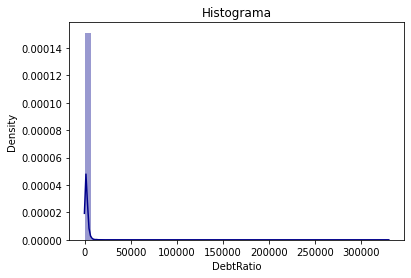

In [28]:
# Crear un histograma de la variable usando la librería seaborns
sns.distplot(x, color="darkblue")
plt.title('Histograma')

In [29]:
# Obtener los deciles de la variable
percentiles = np.arange(start=0.1, stop=1, step=0.1)
x.quantile(percentiles)

0.1       0.030874
0.2       0.133773
0.3       0.213697
0.4       0.287460
0.5       0.366508
0.6       0.467506
0.7       0.649189
0.8       4.000000
0.9    1267.000000
Name: DebtRatio, dtype: float64

Text(0.5, 1.0, 'Boxplot')

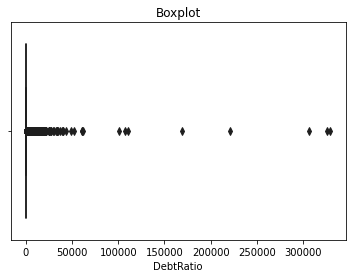

In [30]:
# Crear un box-plot de la variable usando la librería seaborns
sns.boxplot(x=x, color="darkgreen", whis=1.5)
plt.title('Boxplot')

### Análisis multivariante

In [31]:
# Agrupar el DataFrame datos_training por la columna SeriousDlqin2yrs agregando por el promedio para cada columna 
datos_training.groupby(by='SeriousDlqin2yrs').agg('mean')

,Unnamed: 0,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
SeriousDlqin2yrs,,,,,,,,,,,
0,74968.042429,6.168855,52.751375,0.280109,357.151168,6747.837774,8.493620,0.135225,1.020368,0.126666,0.743417
1,75453.643427,4.367282,45.926591,2.388490,295.121066,5630.826493,7.882306,2.091362,0.988530,1.828047,0.948208


Matriz de correlaciones

In [32]:
# Generar la matriz de correlaciones entre las variables del DataFrame datos_training
matriz_corr = datos_training.corr()
matriz_corr

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
Unnamed: 0,1.000000,0.002801,0.002372,0.004403,-0.000571,-0.002906,0.002632,0.004586,-0.001104,-0.000666,-0.000777,-0.000055
SeriousDlqin2yrs,0.002801,1.000000,-0.001802,-0.115386,0.125587,-0.007602,-0.019746,-0.029669,0.117175,-0.007038,0.102261,0.046048
RevolvingUtilizationOfUnsecuredLines,0.002372,-0.001802,1.000000,-0.005898,-0.001314,0.003961,0.007124,-0.011281,-0.001061,0.006235,-0.001048,0.001557
age,0.004403,-0.115386,-0.005898,1.000000,-0.062995,0.024188,0.037717,0.147705,-0.061005,0.033150,-0.057159,-0.213303
NumberOfTime30-59DaysPastDueNotWorse,-0.000571,0.125587,-0.001314,-0.062995,1.000000,-0.006542,-0.010217,-0.055312,0.983603,-0.030565,0.987005,-0.002680
DebtRatio,-0.002906,-0.007602,0.003961,0.024188,-0.006542,1.000000,-0.028712,0.049565,-0.008320,0.120046,-0.007533,-0.040673
MonthlyIncome,0.002632,-0.019746,0.007124,0.037717,-0.010217,-0.028712,1.000000,0.091455,-0.012743,0.124959,-0.011116,0.062647
NumberOfOpenCreditLinesAndLoans,0.004586,-0.029669,-0.011281,0.147705,-0.055312,0.049565,0.091455,1.000000,-0.079984,0.433959,-0.071077,0.065322
NumberOfTimes90DaysLate,-0.001104,0.117175,-0.001061,-0.061005,0.983603,-0.008320,-0.012743,-0.079984,1.000000,-0.045205,0.992796,-0.010176
NumberRealEstateLoansOrLines,-0.000666,-0.007038,0.006235,0.033150,-0.030565,0.120046,0.124959,0.433959,-0.045205,1.000000,-0.039722,0.124684


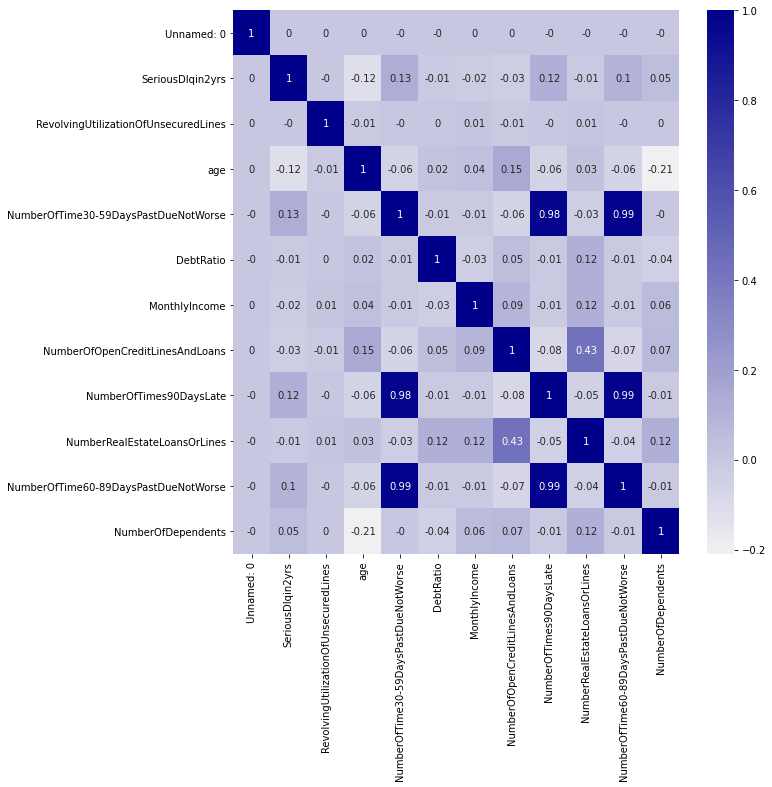

In [33]:
# Graficar la matriz de correlaciones
plt.figure(figsize=(10,10))
sns.heatmap(round(matriz_corr, 2), annot=True, fmt=".2g",
            cmap = sns.light_palette("darkblue", as_cmap=True))

## Hallazgos a partir del análisis exploratorio de datos

En el DataFrame **datos_training:**
- Existen filas que contienen valores iguales en todas sus columnas, sin embargo no es posible determinar si son datos duplicados. **Dado que no se dispone de una columna de id de los clientes**.
- Las variables `MonthlyIncome` y `NumberOfDependents` poseen valores perdidos (NaN) en el DataFrame. **Se recomienda imputar los valores faltantes**
- La variable `SeriousDlqin2yrs` concentra aproximadamente un 6% de clientes que cayeron en Default. **Desbalanceamiento de la variable objetivo**
- La mayor parte de variables en el DataFrame poseen un sesgo positivo. **Alta concentración en los valores iniciales de la distribución (valores de cero)**
- Existe una alta correlación entre las variables `NumberOfTime30-59DaysPastDueNotWorse`, `NumberOfTime60-89DaysPastDueNotWorse`, `NumberOfTimes90DaysLate`. **Se debe a la forma de su medición**